<a href="https://colab.research.google.com/github/ABD-01/Face-Unlock/blob/master/FaceNet_LFW.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from collections import OrderedDict
import collections
from tqdm.notebook import tqdm
from PIL import Image
import PIL
import numpy as np
import os
import time
import matplotlib.pyplot as plt
import random
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils import data
from torch.utils.data import Subset
import torch.optim as optim

import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torchvision.transforms import Compose, ToTensor, Resize
from torch.utils.data import DataLoader

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [3]:
class ResidualBlock(nn.Module):
    
    def __init__(self, n_in :int , n_out :int , stride :int = 1, use_1x1conv=False):
        super(ResidualBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=n_in, out_channels=n_out, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(num_features=n_out)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(in_channels=n_out, out_channels=n_out, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(num_features=n_out)

        self.downsample = None
        if use_1x1conv:
            self.downsample = nn.Sequential(OrderedDict([
                ('conv', nn.Conv2d(in_channels=n_in, out_channels=n_out, kernel_size=1, stride=stride, padding=0, bias=False)),
                ('bn', nn.BatchNorm2d(num_features=n_out))
            ]))

    def forward(self, x):
        x_shortcut = x

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)

        if self.downsample:
            x_shortcut = self.downsample(x_shortcut)

        x = x + x_shortcut
        x = self.relu(x)

        return x

# ref : https://d2l.ai/chapter_convolutional-modern/resnet.html
# ref : https://github.com/pytorch/vision/blob/master/torchvision/models/resnet.py#L144


class ResNet(nn.Module):

    def __init__(self, num_classes=128, inplanes=3, layers = [2,2,2,2]):
        # resnet18 : layers = [2, 2, 2, 2]
        # resnet34 : layers = [3, 4, 6, 3]
        super(ResNet, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=inplanes, out_channels=64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(num_features=64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = nn.Sequential(
            self._make_layer(in_channels = 64, out_channels = 64, num_residuals = layers[0])                                 
        )
                            
        self.layer2 = nn.Sequential(
            self._make_layer(in_channels = 64, out_channels = 128, num_residuals = layers[1], reduce_dim = True) 
         )

        self.layer3 = nn.Sequential(
            self._make_layer(in_channels = 128, out_channels = 256, num_residuals = layers[2], reduce_dim = True) 
        )
                            
        self.layer4 = nn.Sequential(
            self._make_layer(in_channels = 256, out_channels = 512, num_residuals = layers[3], reduce_dim = True) 
        )
            
        self.avgpool = nn.AvgPool2d(kernel_size=7)
        # self.avgpool = nn.AdaptiveAvgPool2d(output_size=(1,1))
        self.fc = nn.Linear(in_features=512*1, out_features=num_classes)

        # Weight initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')

    def _make_layer(self, in_channels:int, out_channels:int, num_residuals: int, reduce_dim = False):
        block_layers = []
        for i in range(num_residuals):
            if i == 0 and reduce_dim:
                block_layers.append((f'block{i+1}', ResidualBlock(n_in = in_channels, n_out = out_channels, stride=2, use_1x1conv = True)))
            else:
                block_layers.append((f'block{i+1}', ResidualBlock(n_in = out_channels, n_out = out_channels)))

        return OrderedDict( block_layers )
    
    # ref : https://d2l.ai/chapter_convolutional-modern/resnet.html

    def semi_forward(self, x):

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = torch.flatten(input=x, start_dim=1) # ref : https://pytorch.org/docs/stable/generated/torch.flatten.html
        x = self.fc(x)
        return x

    def forward(self,triplet):
        # anc = self.semi_forward(triplet[:,0,...])
        # pos = self.semi_forward(triplet[:,1,...])
        # neg = self.semi_forward(triplet[:,2,...])
        
        # triplet.shape = [m, 3, n_C, H, W]
        # batch_size = triplet.shape[0]
        # three = triplet.shape[1]
        # triplet = triplet.view(triplet.shape[0]*triplet.shape[1], *triplet.shape[2:])
        out = self.semi_forward(triplet)
        out = F.normalize(out, p=2, dim=1)
        # out = out.view(batch_size,3, *out.shape[1:])
        # anc_embeddings, pos_embeddings, neg_embeddings = torch.unbind(out, dim=1)
        return out

# ref : https://towardsdatascience.com/understanding-and-visualizing-resnets-442284831be8


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def train_val_dataset(dataset, val_split=0.2):
    train_idx, val_idx = train_test_split(list(range(len(dataset))), test_size=val_split)
    datasets = {}
    datasets['train'] = Subset(dataset, train_idx)
    datasets['val'] = Subset(dataset, val_idx)
    return datasets
# ref: https://discuss.pytorch.org/t/how-to-split-dataset-into-test-and-validation-sets/33987/5

In [ ]:
RGB_MEAN = [ 0.485, 0.456, 0.406 ]
RGB_STD = [ 0.229, 0.224, 0.225 ]

In [5]:
process = transforms.Compose([
    transforms.CenterCrop((114,114)),
    transforms.Resize((224,224), interpolation= transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    # transforms.Normalize(mean=0.2073, std=0.4883),
])

In [ ]:
dataset = ImageFolder('/content/drive/MyDrive/lfw-dataset/lfw-deepfunneled',
                      transform=process)
dataset

Dataset ImageFolder
    Number of datapoints: 13233
    Root location: /content/drive/MyDrive/lfw-dataset/lfw-deepfunneled
    StandardTransform
Transform: Compose(
               CenterCrop(size=(114, 114))
               Resize(size=(224, 224), interpolation=bicubic)
               ToTensor()
           )

In [ ]:
num_of_pixels = len(dataset) * 224 * 224
num_of_pixels

663979008

In [ ]:
loader = DataLoader(dataset, batch_size=100, num_workers=0)

In [ ]:
with torch.no_grad():
    total_sum = 0
    for batch in tqdm(loader): 
        total_sum += batch[0][0].sum()
    mean = total_sum / num_of_pixels

In [ ]:
sum_of_squared_error = 0
for batch in loader: 
    sum_of_squared_error += ((batch[0] - mean).pow(2)).sum()
std = torch.sqrt(sum_of_squared_error / num_of_pixels)

In [ ]:
datasets = train_val_dataset(dataset)

In [ ]:
len(datasets['train']), len(datasets['val'])

(10586, 2647)

In [ ]:
datasets['train'][5][0].shape

torch.Size([3, 112, 112])

In [ ]:
datasets['val'][5][1]

5531

In [ ]:
from glob import glob

In [ ]:
rand_path1 = random.choice(glob(random.choice(glob("/content/drive/MyDrive/lfw-dataset/lfw-cropped/*/"))+'*'))
rand_path2 = rand_path1.replace('cropped', 'deepfunneled').replace('.ppm', '.jpg')
print(rand_path1)
print(rand_path2)

/content/drive/MyDrive/lfw-dataset/lfw-cropped/Lidija_Djukanovic/Lidija_Djukanovic_0001.ppm
/content/drive/MyDrive/lfw-dataset/lfw-deepfunneled/Lidija_Djukanovic/Lidija_Djukanovic_0001.jpg


In [ ]:
img = transforms.functional.to_tensor(
    transforms.functional.resize(
        transforms.functional.center_crop(
            Image.open(rand_path2)
            , (114,114)),
        (224,224), transforms.InterpolationMode.BICUBIC
        ))
img.shape

torch.Size([3, 224, 224])

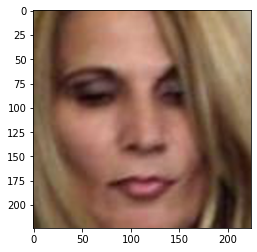

In [ ]:
plt.imshow(img.permute(1,2,0))

torch.Size([3, 64, 64]) torch.Size([3, 250, 250])


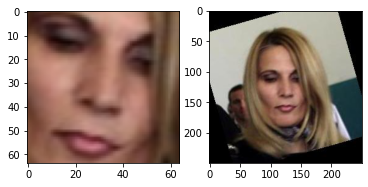

In [ ]:
img1 = transforms.functional.to_tensor(Image.open(rand_path1))
img2 = transforms.functional.to_tensor(Image.open(rand_path2))
print(img1.shape, img2.shape)
_, (axx1, axx2) = plt.subplots(1,2)
axx1.imshow(img1.permute(1,2,0))
axx2.imshow(img2.permute(1,2,0))

In [ ]:
RGB_MEAN = [ 0.485, 0.456, 0.406 ]
RGB_STD = [ 0.229, 0.224, 0.225 ]

In [ ]:
img = transforms.functional.normalize(
            transforms.functional.to_tensor(
                transforms.functional.resize(
                    Image.open("/content/drive/MyDrive/lfw-dataset/lfw-cropped/Chris_Tucker/Chris_Tucker_0001.ppm")
                    , size=(112,112))
                )
            , mean=RGB_MEAN, std=RGB_STD)


In [ ]:
img.mean(), img.std()

(tensor(-0.8732), tensor(0.4623))

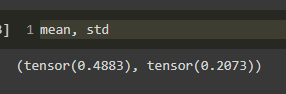

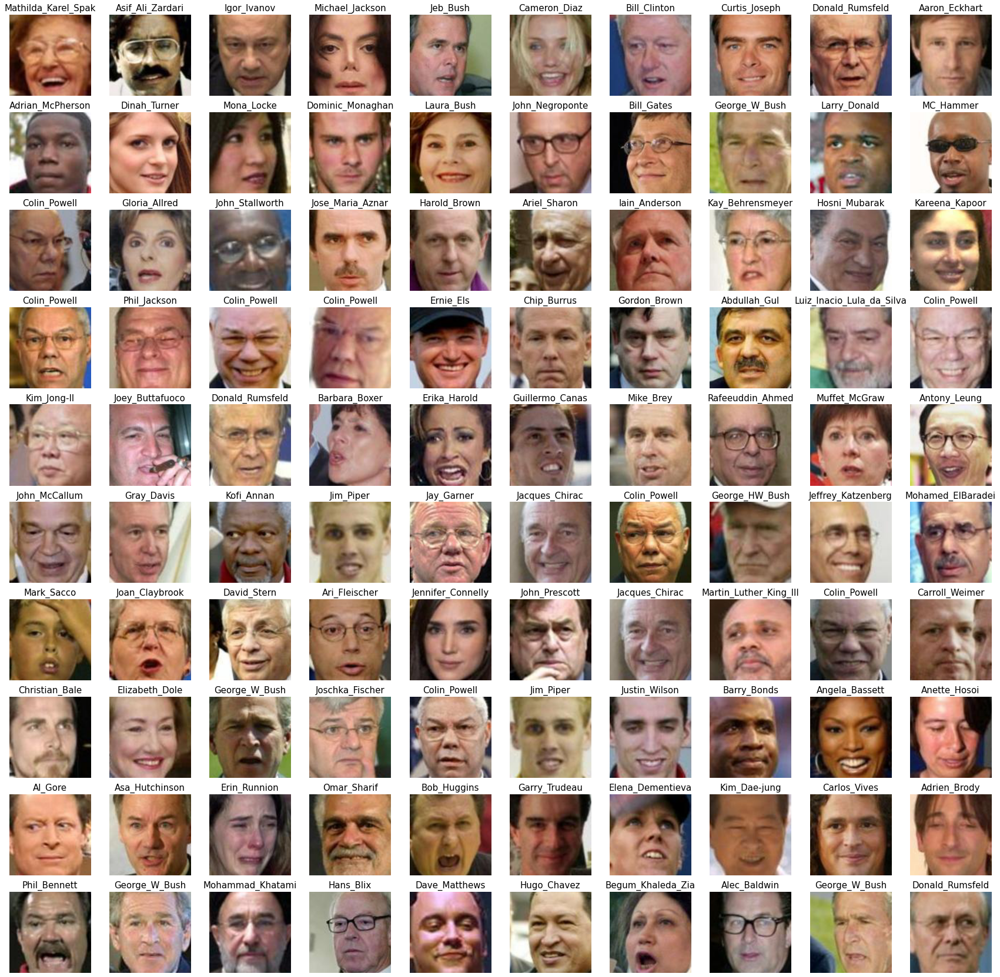

In [ ]:
_, axxr = plt.subplots(10,10, figsize=(30,30))
for ax in axxr.flatten():
    idx = random.randint(0, 10585)
    img = dataset[idx]
    ax.imshow(img[0].permute(1,2,0))
    ax.title.set_text(dataset.classes[img[1]])
    ax.title.set_size(15)
    ax.axis('off')
plt.show()

In [ ]:
resnet18 = ResNet()
resnet18.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (block1): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (block2): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(

In [ ]:
!pip install wandb
!wandb login

     |████████████████████████████████| 1.8MB 8.1MB/s 
     |████████████████████████████████| 133kB 52.0MB/s 
     |████████████████████████████████| 102kB 13.2MB/s 
     |████████████████████████████████| 174kB 50.0MB/s 
     |████████████████████████████████| 71kB 11.0MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-cp37-none-any.whl size=8786 sha256=f9095256f5472b21830d8d686ae6ba1dba41843b1565fb2d6508a50598a26af0
  Stored in directory: /root/.cache/pip/wheels/0b/04/79/c3b0c3a0266a3cb4376da31e5bfe8bba0c489246968a68e843
  Created wheel for subprocess32: filename=subprocess32-3.5.4-cp37-none-any.whl size=6489 sha256=ffb1eeabeee5d24460c7191f04bfab38af04607bc741a7f56e67eb8e807123e5
  Stored in directory: /root/.cache/pip/wheels/68/39/1a/5e402bdfdf004af1786c8b853fd92f8c4a04f22aad179654d1
Successfully built pathtools subprocess32
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter: 
wandb: A

In [ ]:
import wandb
# 1. Start a new run
wandb.init(project="Face-Unlock", resume=True, id='2ftxlvtn')

In [ ]:
# 2. Save model inputs and hyperparameters
config = wandb.config
config.batch_size = 100
config.epochs = 100
config.learning_rate = "0.01, Reduce on Plateau"
config.fc_layer_size = 128
config.train_dataset = "LFW"
config.architechture = "ResNet18"

In [ ]:
!wget https://raw.githubusercontent.com/ABD-01/Face-Unlock/master/triplet_loss.py
!wget https://raw.githubusercontent.com/ABD-01/Face-Unlock/master/eval.py

--2021-05-28 14:51:06--  https://raw.githubusercontent.com/ABD-01/Face-Unlock/master/triplet_loss.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8922 (8.7K) [text/plain]
Saving to: ‘triplet_loss.py’

triplet_loss.py     100%[===================>]   8.71K  --.-KB/s    in 0.001s  

2021-05-28 14:51:06 (9.77 MB/s) - ‘triplet_loss.py’ saved [8922/8922]

--2021-05-28 14:51:06--  https://raw.githubusercontent.com/ABD-01/Face-Unlock/master/eval.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2542 (2.5K) [text/plain]
Saving to: ‘ev

In [ ]:
import triplet_loss
from eval import calculate_metrics, evaluate

In [ ]:
batch_size = 100
dataloaders = {x:DataLoader(datasets[x], batch_size, shuffle=True, ) for x in ['train','val']}

In [ ]:
batch_size = 64
loader = DataLoader(dataset, batch_size=batch_size, num_workers=1, shuffle=True)

In [ ]:
optimizer18 = optim.Adam(resnet18.parameters(), lr = 0.0004, amsgrad=True)

In [ ]:
scheduler18 = optim.lr_scheduler.ReduceLROnPlateau(optimizer18, factor=0.8, 
                                                   patience=100,
                                                   min_lr=0.00001,
                                                   verbose=True)

In [ ]:
wandb.watch(resnet18, criterion="tripletloss", log='all')

In [ ]:
resnet18.train()
epochs_loss =[]
epochs = 10
for epoch in range(epochs):
    try:
        epoch_loss = 0
        for step, (images, labels) in enumerate(loader):
            print(f"Epoch: {epoch:02d}, Step: {step:02d},", end=" ")
            start_time = time.time()

            embds = resnet18(images.to(device)).to('cpu')

            loss = triplet_loss.batch_hard_triplet_loss(labels, embds, margin=1)
            epoch_loss += loss.item()

            optimizer18.zero_grad()
            loss.backward()
            optimizer18.step()
            # scheduler18.step(loss)

            wandb.log({"loss": loss.item(),
                    "lr":optimizer18.state_dict()["param_groups"][0]['lr']})
            # print(f"Loss: {loss.item():.3f}, +ve triplets: {fpt:.2f},", end=" ")
            print(f"Loss: {loss.item():.3f}, ", end=" ")

            current_time = time.time()
            print("Time: {:.4f}s".format(current_time-start_time))
        wandb.log({"epoch_loss": epoch_loss/config.batch_size})
        epochs_loss.append(epoch_loss/config.batch_size)
    except RuntimeError as re:
        device = torch.device('cpu')
        torch.save(resnet18.state_dict(), f"/content/drive/MyDrive/Colab Notebooks/resnet18_lfw2_checkpoint{epoch+2}.pth")
        resnet18.cpu()
        print(f"{re}: Shifted to CPU")

Streaming output truncated to the last 5000 lines.
hardest_negative_dist tensor(0.9991, grad_fn=<MeanBackward0>)
Loss: 0.024,  Time: 0.0826s
Epoch: 01, Step: 197, hardest_positive_dist tensor(0.1547, grad_fn=<MeanBackward0>)
hardest_negative_dist tensor(0.9941, grad_fn=<MeanBackward0>)
Loss: 0.186,  Time: 0.0900s
Epoch: 01, Step: 198, hardest_positive_dist tensor(0.1240, grad_fn=<MeanBackward0>)
hardest_negative_dist tensor(1.0088, grad_fn=<MeanBackward0>)
Loss: 0.144,  Time: 0.0829s
Epoch: 01, Step: 199, hardest_positive_dist tensor(0.0347, grad_fn=<MeanBackward0>)
hardest_negative_dist tensor(0.9827, grad_fn=<MeanBackward0>)
Loss: 0.073,  Time: 0.0822s
Epoch: 01, Step: 200, hardest_positive_dist tensor(0.0495, grad_fn=<MeanBackward0>)
hardest_negative_dist tensor(0.9851, grad_fn=<MeanBackward0>)
Loss: 0.087,  Time: 0.0847s
Epoch: 01, Step: 201, hardest_positive_dist tensor(0.1424, grad_fn=<MeanBackward0>)
hardest_negative_dist tensor(0.9743, grad_fn=<MeanBackward0>)
Loss: 0.192,  Tim

In [ ]:
torch.save(resnet18.state_dict(), f"/content/drive/MyDrive/Colab Notebooks/resnet18_lfw2.pth")

In [192]:
resnet18 = ResNet()
resnet18.load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/resnet18_lfw2_checkpoint58.pth"))

<All keys matched successfully>

In [ ]:
resnet18.eval()

In [196]:
resnet18.conv1.weight.device

device(type='cuda', index=0)

In [ ]:
resnet18.cuda()

In [11]:
!wget http://vis-www.cs.umass.edu/lfw/pairsDevTrain.txt
!wget http://vis-www.cs.umass.edu/lfw/pairsDevTest.txt

--2021-05-28 19:24:52--  http://vis-www.cs.umass.edu/lfw/pairsDevTrain.txt
Resolving vis-www.cs.umass.edu (vis-www.cs.umass.edu)... 128.119.244.95
Connecting to vis-www.cs.umass.edu (vis-www.cs.umass.edu)|128.119.244.95|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 56579 (55K) [text/plain]
Saving to: ‘pairsDevTrain.txt’

pairsDevTrain.txt   100%[===================>]  55.25K  --.-KB/s    in 0.03s   

2021-05-28 19:24:52 (1.71 MB/s) - ‘pairsDevTrain.txt’ saved [56579/56579]

--2021-05-28 19:24:52--  http://vis-www.cs.umass.edu/lfw/pairsDevTest.txt
Resolving vis-www.cs.umass.edu (vis-www.cs.umass.edu)... 128.119.244.95
Connecting to vis-www.cs.umass.edu (vis-www.cs.umass.edu)|128.119.244.95|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26002 (25K) [text/plain]
Saving to: ‘pairsDevTest.txt’

pairsDevTest.txt    100%[===================>]  25.39K  --.-KB/s    in 0.02s   

2021-05-28 19:24:52 (1.28 MB/s) - ‘pairsDevTest.txt’ saved [26002

In [12]:
!wget http://vis-www.cs.umass.edu/lfw/pairs.txt

--2021-05-28 19:24:52--  http://vis-www.cs.umass.edu/lfw/pairs.txt
Resolving vis-www.cs.umass.edu (vis-www.cs.umass.edu)... 128.119.244.95
Connecting to vis-www.cs.umass.edu (vis-www.cs.umass.edu)|128.119.244.95|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 155335 (152K) [text/plain]
Saving to: ‘pairs.txt’

pairs.txt           100%[===================>] 151.69K  --.-KB/s    in 0.05s   

2021-05-28 19:24:52 (3.02 MB/s) - ‘pairs.txt’ saved [155335/155335]



In [13]:
class LFW_Pairs(torch.utils.data.Dataset):

    def __init__(self, root, pairs_path, transform=None, ext="jpg"):
        super(LFW_Pairs, self).__init__()
        self.images_dir = root
        self.transform = transform
        self.pairs = self._get_pairs(pairs_path)
        self.pair_paths = []
        self.is_same_list = []
        self.ids = []

        self.pair_paths, self.is_same_list, self.ids =  self._get_pairs_path(self.images_dir, self.pairs, ext)


    def _get_pairs(self, pairs_path):
        pairs = []
        with open(pairs_path, 'r') as f:
            flines = f.readlines()
            num_pairs = int(flines[0])*2
            print("Number of pairs:", num_pairs)
            for line in flines[1:]:
                pair = line.strip().split()
                pairs.append(pair)
        assert len(pairs) == num_pairs, "Something went wrong"
        return np.array(pairs, dtype=object)


    def _get_pairs_path(self, images_dir, pairs, ext="jpg"):
        num_skipped = 0
        pair_paths = []
        is_same = []
        img_ids = []
        bar = tqdm(pairs, desc="Getting pairs", total=len(pairs))
        print()
        for pair in bar:
            if len(pair) == 3:
                img1 = os.path.join(images_dir, pair[0], "{}_{:04d}.{}".format(pair[0], int(pair[1]), ext))
                img2 = os.path.join(images_dir, pair[0], "{}_{:04d}.{}".format(pair[0], int(pair[2]), ext))
                same = True
                img_ids.append((pair[0]))
            elif len(pair) == 4:
                img1 = os.path.join(images_dir, pair[0], "{}_{:04d}.{}".format(pair[0], int(pair[1]), ext))
                img2 = os.path.join(images_dir, pair[2], "{}_{:04d}.{}".format(pair[2], int(pair[3]), ext))
                same = False
                img_ids.append((pair[0], pair[2]))
            if os.path.exists(img1) and os.path.exists(img2):
                pair_paths.append((img1, img2))
                is_same.append(same)
            else:
                num_skipped += 1 
                print("Not found:", img1 , "or", img2)
            if num_skipped>0:
                print(f"Skipped {num_skipped} images")
        return pair_paths, is_same, img_ids


    def __len__(self):
        return self.pair_paths.__len__()

    def loader(self, path: str) -> Image.Image:
        with open(path, 'rb') as f:
            img = Image.open(f)
            return img.convert('RGB')

    def __getitem__(self, idx):
        path1, path2 = self.pair_paths[idx]
        is_same = self.is_same_list[idx]
        sample1 = self.loader(path1)
        sample2 = self.loader(path2)
        if self.transform is not None:
            sample1 = self.transform(sample1)
            sample2 = self.transform(sample2)
        
        return sample1, sample2, is_same, idx

In [197]:
lfw_pairs = LFW_Pairs("/content/drive/MyDrive/lfw-dataset/lfw-deepfunneled", "pairs.txt", process)

Number of pairs: 6000


In [198]:
loader = DataLoader(lfw_pairs,batch_size=100)

In [199]:
features = []
distances = []
with torch.no_grad():
    
    for pair1, pair2, _, _ in tqdm(loader):
        embds1 = resnet18(pair1.cuda()).cpu()
        embds2 = resnet18(pair2.cuda()).cpu()
        features.append((embds1, embds2))
        distance = (embds1 - embds2).norm(p=2, dim=1)
        distances.append(distance)

In [200]:
features[0][0].shape, distances[0].shape

(torch.Size([100, 128]), torch.Size([100]))

In [201]:
len(distances)

60

In [202]:
distances = torch.cat(distances)
distances.shape

torch.Size([6000])

In [203]:
psame = np.asarray(lfw_pairs.is_same_list)
psame.shape

(6000,)

In [173]:
def calculate_metrics(threshold, dist, psame):
    pdiff = np.logical_not(psame)
    preds = np.less(dist, threshold)
    
    true_accepts  = np.sum(np.logical_and(preds, psame))
    false_accepts = np.sum(np.logical_and(preds, pdiff))
    # false_rejects = np.sum(np.logical_and(np.logical_not(preds), psame))
    true_rejects  = np.sum(np.logical_and(np.logical_not(preds), pdiff))

    val = true_accepts  / (psame.sum() + 1e-16) # sensitivity, recall
    far = false_accepts / (pdiff.sum() + 1e-16) # (1-specificity)
    # frr = false_rejects / (psame.sum() + 1e-16)
    # frr = 1 - val
    # trr = true_rejects  / (pdiff.sum() + 1e-16) # specificity 
    # trr = 1 - far

    precision = true_accepts / (true_accepts + false_accepts + 1e-16)
    # a ratio of correctly predicted positive observations to the total predicted positive observations
    accuracy = (true_accepts + true_rejects) / (psame.sum() + pdiff.sum() + 1e-16)
    # a ratio of correctly predicted observation to the total observations

    return val, far, precision, accuracy

In [204]:
val, far, precision, accuracy = calculate_metrics(1.29, distances.detach().numpy(), psame)

print(f"True accept rate = {val}")
print(f"False Accept Rate = {far}")
print(f"Precision = {precision}")
print(f"Accuracy = {accuracy}")

True accept rate = 0.6783333333333333
False Accept Rate = 0.27366666666666667
Precision = 0.7125350140056023
Accuracy = 0.7023333333333334


In [205]:
def evaluate(distances, labels, roc_curve=False):
    # mask = np.logical_not(np.eye(labels.shape[0], dtype='bool'))
    # Psame = labels[mask]
    # distances = distances[mask]
    thresholds = np.arange(0,4,0.01)
    num_thresholds = len(thresholds)
    vals = np.zeros(num_thresholds)
    fars = np.zeros(num_thresholds)
    youdens = np.zeros(num_thresholds)
    for idx, threshold in tqdm(enumerate(thresholds)):
        vals[idx], fars[idx], _, _ = calculate_metrics(threshold, distances, labels)
        youdens[idx] = vals[idx] - fars[idx] # sensitivity + specificity — 1
    best_threshold_idx = np.argmax(youdens) 

    if roc_curve:
        fig = plt.figure()
        plt.plot(fars, vals, marker = '.', c='r')
        plt.plot([0,1], [0,1], linestyle='--')
        plt.scatter(fars[best_threshold_idx], vals[best_threshold_idx], c='black', label='Optimal Threshold')
        plt.grid()
        plt.title('ROC Curve')
        plt.xlabel('False Accept Rate (FAR)')
        plt.ylabel('True Accept Rate (VAL)')
        plt.legend()
        plt.savefig('ROC_curve')
        plt.show()


    true_accept_rate, false_accept_rate, precision, accuracy = \
         calculate_metrics(thresholds[best_threshold_idx], distances, labels)

    return thresholds[best_threshold_idx], true_accept_rate, false_accept_rate, precision, accuracy

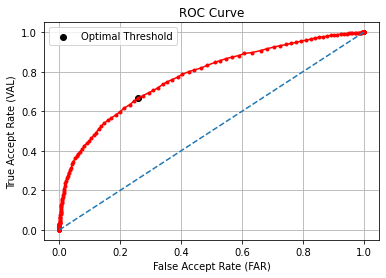

In [206]:
best_threshold, tar, far, precision, accuracy  = evaluate(distances.detach().numpy(), psame, True)

In [207]:
print("Best Threshold: {}\nTrue Acceptance: {:.3f}\nFalse Acceptance: {:.3f}\nPrecision: {:.3f}\nAccuracy: {:.3f}".format(best_threshold, tar, far, precision, accuracy ))

Best Threshold: 1.28
True Acceptance: 0.667
False Acceptance: 0.260
Precision: 0.720
Accuracy: 0.704


In [62]:
!wget https://raw.githubusercontent.com/tamerthamoqa/facenet-pytorch-glint360k/63a18012427311e7df0773e045ada88b32fb854c/validate_on_LFW.py

--2021-05-28 19:48:45--  https://raw.githubusercontent.com/tamerthamoqa/facenet-pytorch-glint360k/63a18012427311e7df0773e045ada88b32fb854c/validate_on_LFW.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8721 (8.5K) [text/plain]
Saving to: ‘validate_on_LFW.py.1’

validate_on_LFW.py. 100%[===================>]   8.52K  --.-KB/s    in 0s      

2021-05-28 19:48:45 (95.8 MB/s) - ‘validate_on_LFW.py.1’ saved [8721/8721]



In [178]:
from validate_on_LFW import evaluate_lfw

In [208]:
true_positive_rate, false_positive_rate, precision, recall, accuracy, roc_auc, best_distances, \
        tar, far = evaluate_lfw(
            distances=distances.detach().numpy(),
            labels=psame,
            far_target=1e-1
        )
# Print statistics and add to log
print("Accuracy on LFW: {:.4f}+-{:.4f}\nPrecision {:.4f}+-{:.4f}\nRecall {:.4f}+-{:.4f}\n"
        "ROC Area Under Curve: {:.4f}\nBest distance threshold: {:.2f}+-{:.2f}\n"
        "TAR: {:.4f}+-{:.4f} @ FAR: {:.4f}".format(
            np.mean(accuracy),
            np.std(accuracy),
            np.mean(precision),
            np.std(precision),
            np.mean(recall),
            np.std(recall),
            roc_auc,
            np.mean(best_distances),
            np.std(best_distances),
            np.mean(tar),
            np.std(tar),
            np.mean(far)
        ))

Accuracy on LFW: 0.7020+-0.0190
Precision 0.7209+-0.0187
Recall 0.6593+-0.0326
ROC Area Under Curve: 0.7743
Best distance threshold: 1.28+-0.00
TAR: 0.4507+-0.0259 @ FAR: 0.0993


In [45]:
def dist(enc1,enc2):
    return (enc1 - enc2).pow(2).sum(-1).pow(.5)

In [46]:
distances[6]

tensor(0.8009)

In [57]:
features[0][0][6].shape, features[0][1][6].shape

(torch.Size([128]), torch.Size([128]))

In [58]:
dist(features[0][0][6], features[0][1][6])

tensor(0.8009)

# Validating

In [209]:
preds = distances.detach().numpy()<1.28

In [210]:
pdiff = np.logical_not(psame)

true_accepts  = np.sum(np.logical_and(preds, psame))
false_accepts = np.sum(np.logical_and(preds, pdiff))
# false_rejects = np.sum(np.logical_and(np.logical_not(preds), psame))
true_rejects  = np.sum(np.logical_and(np.logical_not(preds), pdiff))

true_accepts, false_accepts, true_rejects

(2001, 780, 2220)

In [211]:
psame.sum(), pdiff.sum()

(3000, 3000)

In [212]:
val = true_accepts  / (psame.sum() + 1e-16) # sensitivity, recall
far = false_accepts / (pdiff.sum() + 1e-16) # (1-specificity)

val, far

(0.667, 0.26)

In [213]:
false_accepts = np.logical_and(preds, pdiff)

In [214]:
false_accepts.sum()

780

In [215]:
false_accept_idxs =  (false_accepts == 1).nonzero()[0]
false_accept_idxs.shape

(780,)

423


<Figure size 432x288 with 0 Axes>

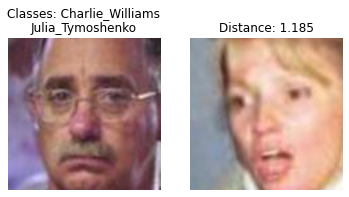

255


<Figure size 432x288 with 0 Axes>

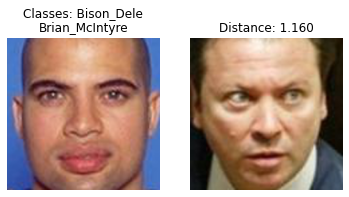

373


<Figure size 432x288 with 0 Axes>

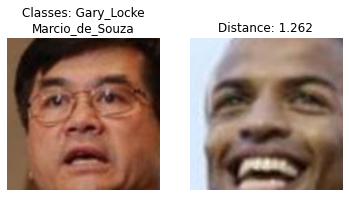

361


<Figure size 432x288 with 0 Axes>

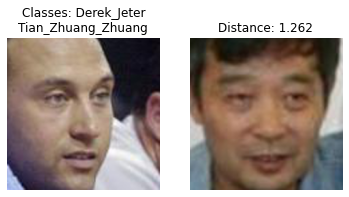

194


<Figure size 432x288 with 0 Axes>

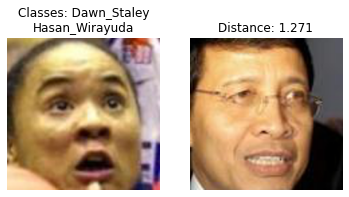

474


<Figure size 432x288 with 0 Axes>

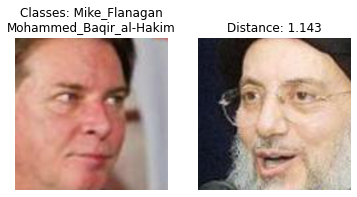

188


<Figure size 432x288 with 0 Axes>

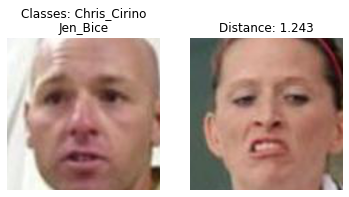

517


<Figure size 432x288 with 0 Axes>

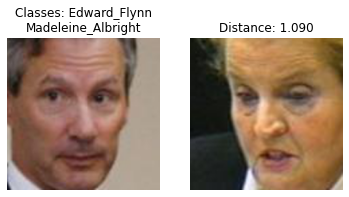

606


<Figure size 432x288 with 0 Axes>

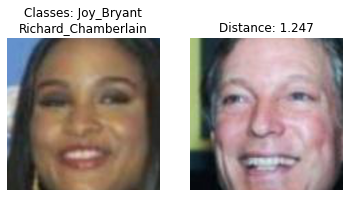

670


<Figure size 432x288 with 0 Axes>

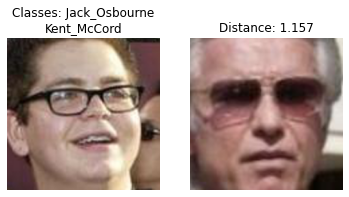

341


<Figure size 432x288 with 0 Axes>

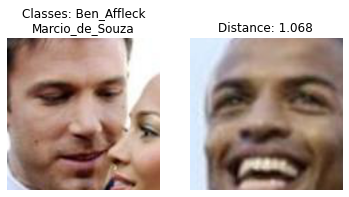

513


<Figure size 432x288 with 0 Axes>

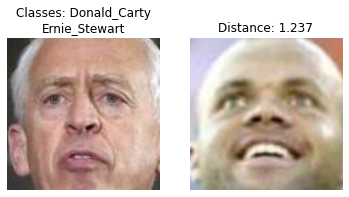

493


<Figure size 432x288 with 0 Axes>

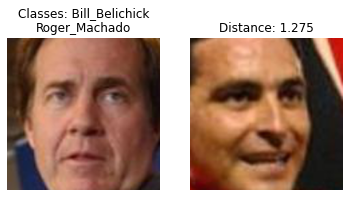

287


<Figure size 432x288 with 0 Axes>

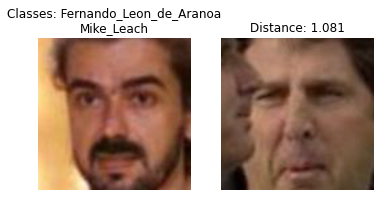

748


<Figure size 432x288 with 0 Axes>

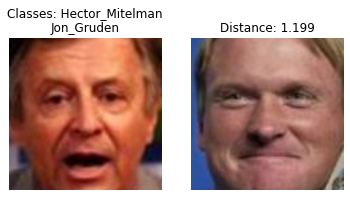

567


<Figure size 432x288 with 0 Axes>

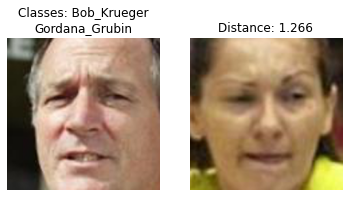

269


<Figure size 432x288 with 0 Axes>

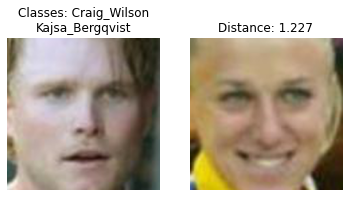

363


<Figure size 432x288 with 0 Axes>

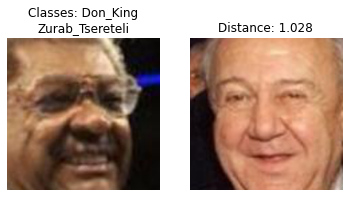

771


<Figure size 432x288 with 0 Axes>

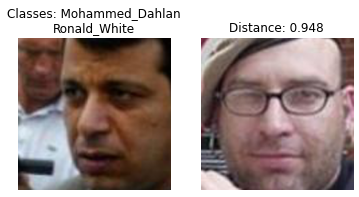

128


<Figure size 432x288 with 0 Axes>

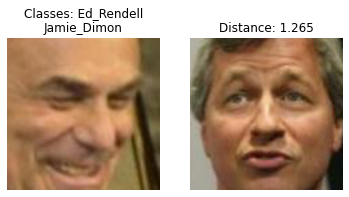

9


<Figure size 432x288 with 0 Axes>

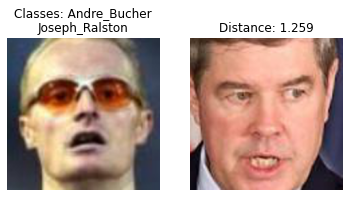

548


<Figure size 432x288 with 0 Axes>

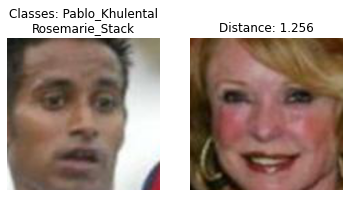

155


<Figure size 432x288 with 0 Axes>

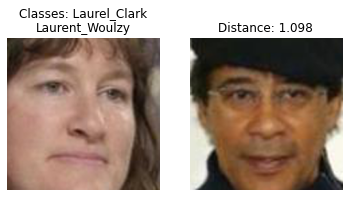

774


<Figure size 432x288 with 0 Axes>

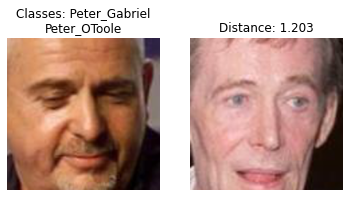

411


<Figure size 432x288 with 0 Axes>

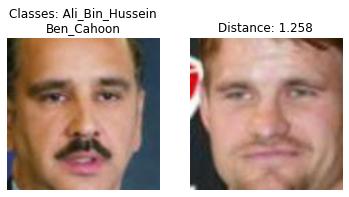

65


<Figure size 432x288 with 0 Axes>

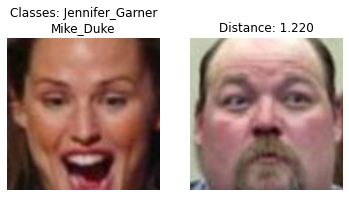

751


<Figure size 432x288 with 0 Axes>

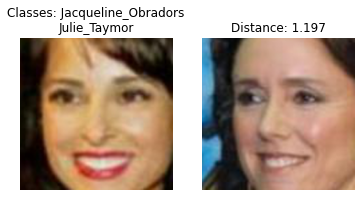

720


<Figure size 432x288 with 0 Axes>

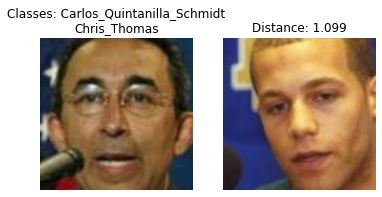

17


<Figure size 432x288 with 0 Axes>

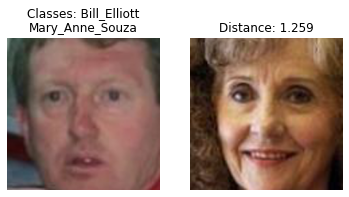

762


<Figure size 432x288 with 0 Axes>

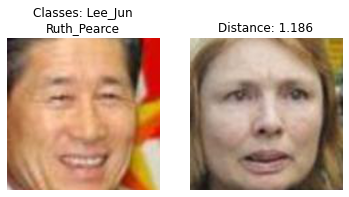

In [216]:
for idx in np.random.randint(0,false_accept_idxs.shape[0], size=30):
    print(idx)
    plt.figure()
    _,(i1,i2) = plt.subplots(1,2)

    idx1= false_accept_idxs[idx]
    img1, img2, same, idx2 =  lfw_pairs[idx1]

    i1.imshow(img1.permute(1,2,0))
    i2.imshow(img2.permute(1,2,0))
    # i1.title.set_text(f'Classes: {path_list[idx1].split("/")[-2]}\n{path_list[idx2].split("/")[-2]}')
    i1.title.set_text('Classes: {}'.format("\n".join(lfw_pairs.ids[idx2])))
    i2.title.set_text(f'Distance: {distances[idx1]:.3f}')
    i1.axis('off')
    i2.axis('off')

    plt.show()

In [217]:
false_rejects = np.logical_and(np.logical_not(preds), psame)

In [218]:
false_rejects.sum()

999

In [219]:
false_rejects_idxs =  (false_rejects == 1).nonzero()[0]
false_rejects_idxs.shape

(999,)

726


<Figure size 432x288 with 0 Axes>

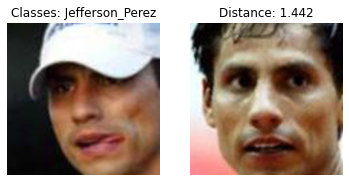

237


<Figure size 432x288 with 0 Axes>

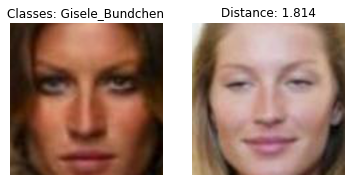

550


<Figure size 432x288 with 0 Axes>

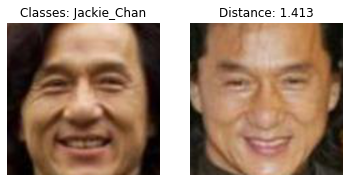

365


<Figure size 432x288 with 0 Axes>

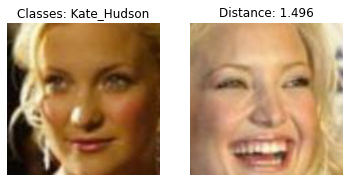

363


<Figure size 432x288 with 0 Axes>

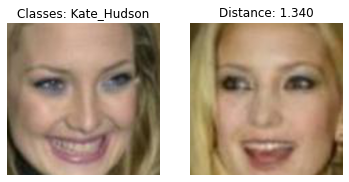

474


<Figure size 432x288 with 0 Axes>

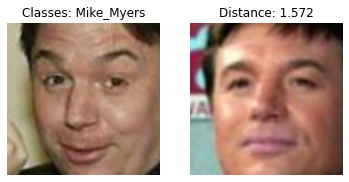

311


<Figure size 432x288 with 0 Axes>

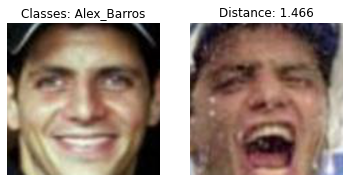

65


<Figure size 432x288 with 0 Axes>

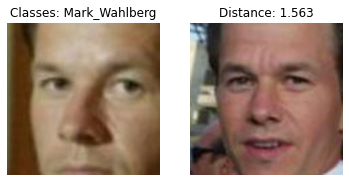

204


<Figure size 432x288 with 0 Axes>

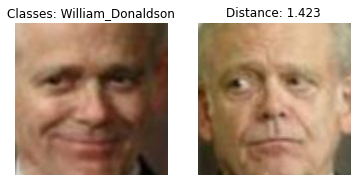

591


<Figure size 432x288 with 0 Axes>

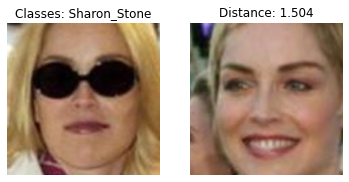

709


<Figure size 432x288 with 0 Axes>

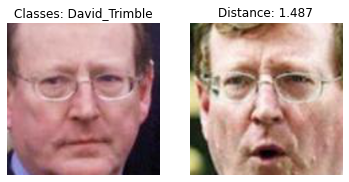

592


<Figure size 432x288 with 0 Axes>

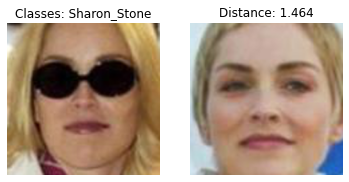

450


<Figure size 432x288 with 0 Axes>

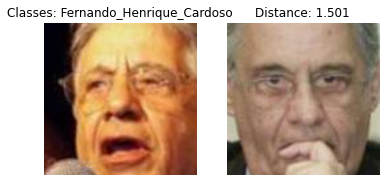

116


<Figure size 432x288 with 0 Axes>

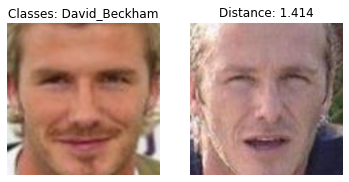

733


<Figure size 432x288 with 0 Axes>

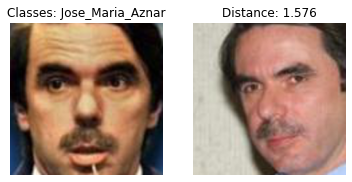

423


<Figure size 432x288 with 0 Axes>

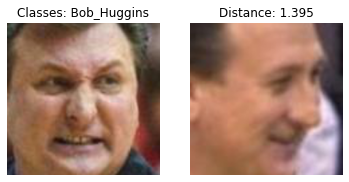

700


<Figure size 432x288 with 0 Axes>

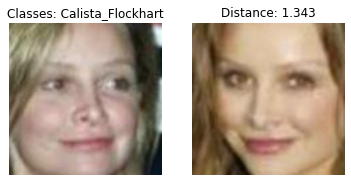

594


<Figure size 432x288 with 0 Axes>

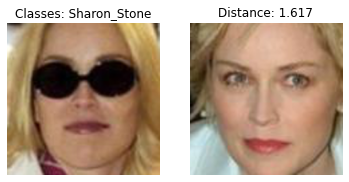

111


<Figure size 432x288 with 0 Axes>

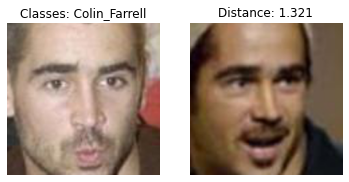

856


<Figure size 432x288 with 0 Axes>

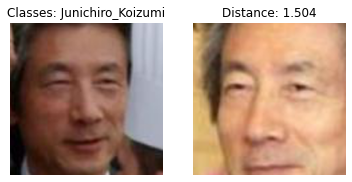

844


<Figure size 432x288 with 0 Axes>

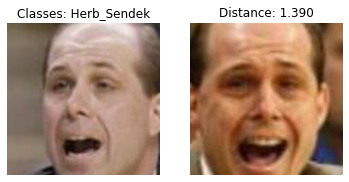

340


<Figure size 432x288 with 0 Axes>

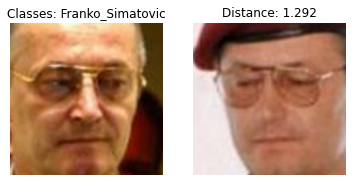

659


<Figure size 432x288 with 0 Axes>

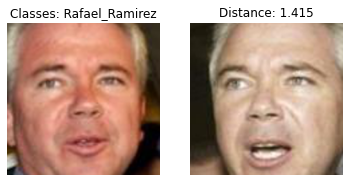

242


<Figure size 432x288 with 0 Axes>

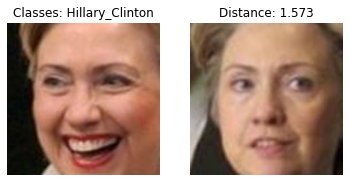

134


<Figure size 432x288 with 0 Axes>

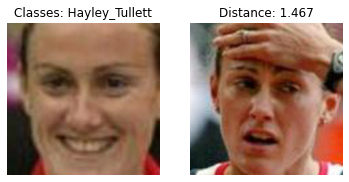

283


<Figure size 432x288 with 0 Axes>

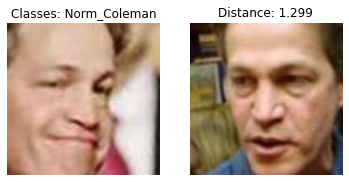

560


<Figure size 432x288 with 0 Axes>

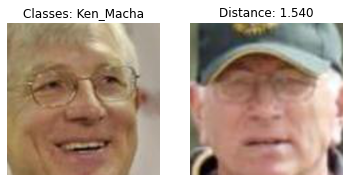

809


<Figure size 432x288 with 0 Axes>

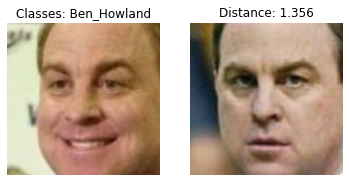

654


<Figure size 432x288 with 0 Axes>

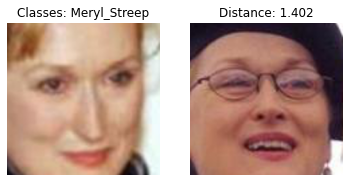

709


<Figure size 432x288 with 0 Axes>

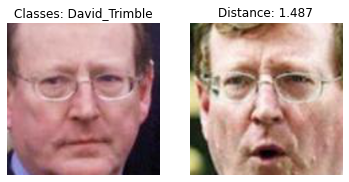

In [220]:
for idx in np.random.randint(0,false_rejects_idxs.shape[0], size=30):
    print(idx)
    plt.figure()
    _,(i1,i2) = plt.subplots(1,2)

    idx1= false_rejects_idxs[idx]
    img1, img2, same, idx2 =  lfw_pairs[idx1]

    i1.imshow(img1.permute(1,2,0))
    i2.imshow(img2.permute(1,2,0))
    i1.title.set_text('Classes: {}'.format(lfw_pairs.ids[idx2]))
    i2.title.set_text(f'Distance: {distances[idx1]:.3f}')
    i1.axis('off')
    i2.axis('off')

    plt.show()

# Sweep

In [ ]:
import wandb

In [ ]:
sweep_config = {
    'method': 'random' # grid, random, bayes
    }

In [ ]:
metric = {
    'name': 'loss',
    'goal': 'minimize'
    }
sweep_config['metric'] = metric

In [ ]:
parameter_dict = {
    'fc_layer_size': {
        'values': [64, 128, 256]
    },
    'learning_rate': {
        'values': [0.001, 0.002,  0.0002, 0.0001]
    },
    'batch_size': {
        'values': [100, 200, 500]
    },
    'epochs': {
        'values': [10,50,100]
    }
}
sweep_config['parameters'] = parameter_dict

In [ ]:
import pprint

pprint.pprint(sweep_config)

{'method': 'random',
 'metric': {'goal': 'minimize', 'name': 'loss'},
 'parameters': {'batch_size': {'values': [100, 200, 500]},
                'epochs': {'values': [10, 50, 100]},
                'fc_layer_size': {'values': [64, 128, 256]},
                'learning_rate': {'values': [0.001, 0.002, 0.0002, 0.0001]}}}


In [ ]:
sweep_id = wandb.sweep(sweep_config, project='Face-Unlock')

Create sweep with ID: q77dzonw
Sweep URL: https://wandb.ai/abd1/Face-Unlock/sweeps/q77dzonw


In [ ]:
def pairs_mask(labels):
    induces_not_equal = torch.eye(labels.shape[0]).bool().logical_not()
    return induces_not_equal

In [ ]:
import torch.optim as optim

In [ ]:
def train():
    # Default values for hyper-parameters we're going to sweep over
    config_defaults = {
        'batch_size': 100,
        'epochs': 20,
        'fc_layer_size': 128,
        'learning_rate': 0.001,
    }

    # Initialize a new wandb run
    wandb.init(config=config_defaults)

    # Config is a variable that holds and saves hyperparameters and inputs
    config = wandb.config

    # define model
    network = ResNet(num_classes=config.fc_layer_size)
    # train loader 
    loader = DataLoader(datasets['train'], config.batch_size, shuffle=True, num_workers=1)
    # optimizer
    optimizer = optim.Adam(network.parameters(), lr=config.learning_rate)

    network.train()
    for epoch in range(config.epochs):
        epoch_loss = 0
        for images, labels in loader:
            optimizer.zero_grad()
            embds = network(images)
            loss, fpt = triplet_loss.batch_all_triplet_loss(labels, embds, margin=1)
            epoch_loss += loss.item()
            wandb.log({"loss": loss.item(), "fraction_of_positive_triplets": fpt}, commit=False)
            loss.backward()
            optimizer.step()

        wandb.log({"epoch_loss": epoch_loss / config.batch_size})

In [ ]:
wandb.agent(sweep_id, train, count=10)

wandb: Agent Starting Run: b4gy35es with config:
wandb: 	batch_size: 500
wandb: 	epochs: 10
wandb: 	fc_layer_size: 128
wandb: 	learning_rate: 0.002


Run b4gy35es errored: RuntimeError('Given input size: (512x4x4). Calculated output size: (512x0x0). Output size is too small')
wandb: ERROR Run b4gy35es errored: RuntimeError('Given input size: (512x4x4). Calculated output size: (512x0x0). Output size is too small')
wandb: Agent Starting Run: szt2ht7g with config:
wandb: 	batch_size: 100
wandb: 	epochs: 50
wandb: 	fc_layer_size: 256
wandb: 	learning_rate: 0.001


Run szt2ht7g errored: RuntimeError('Given input size: (512x4x4). Calculated output size: (512x0x0). Output size is too small')
wandb: ERROR Run szt2ht7g errored: RuntimeError('Given input size: (512x4x4). Calculated output size: (512x0x0). Output size is too small')
wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: pol5m0w9 with config:
wandb: 	batch_size: 500
wandb: 	epochs: 50
wandb: 	fc_layer_size: 128
wandb: 	learning_rate: 0.0001


Run pol5m0w9 errored: RuntimeError('Given input size: (512x4x4). Calculated output size: (512x0x0). Output size is too small')
wandb: ERROR Run pol5m0w9 errored: RuntimeError('Given input size: (512x4x4). Calculated output size: (512x0x0). Output size is too small')
wandb: Agent Starting Run: kqvs3v0l with config:
wandb: 	batch_size: 500
wandb: 	epochs: 10
wandb: 	fc_layer_size: 64
wandb: 	learning_rate: 0.0001


In [ ]:
wandb.finish()